In [1]:
import os
import glob
from csv import DictReader
import shutil
import glob
import plotnine as p9
import pandas as pd
from pathlib import Path

In [2]:
clinical_data = pd.read_csv("clinical_data.csv")

In [3]:
mask_data = pd.read_csv("/data/embryo/csv/final_max_mask.csv")
yolo_data = pd.read_csv("/data/embryo/csv/final_max_yolo.csv")

In [6]:
base_dir = '/data/embryo/base/'
dir_lst = []
with open("/data/embryo/csv/final_max_mask.csv", 'r') as read_obj:
    csv_dict_reader = DictReader(read_obj)
    for row in csv_dict_reader:
        batch = row['Batch']
        id = row['ID']
        dir_name = batch + '_pdb_' + id
        dir_path = Path(base_dir + dir_name)
        if dir_path.exists():
            dir_name = dir_name
        else:
            batch = batch.rsplit('_P', 1)[0]
            dir_name = batch + '_' + id
            dir_path = Path(base_dir + dir_name)
        dir_lst.append(dir_name)
mask_data['Dir'] = dir_lst




In [7]:
base_dir = '/data/embryo/base/'
dir_lst = []
with open("/data/embryo/csv/final_max_yolo.csv", 'r') as read_obj:
    csv_dict_reader = DictReader(read_obj)
    for row in csv_dict_reader:
        batch = row['Batch']
        id = row['ID']
        dir_name = batch + '_pdb_' + id
        dir_path = Path(base_dir + dir_name)
        if dir_path.exists():
            dir_name = dir_name
        else:
            batch = batch.rsplit('_P', 1)[0]
            dir_name = batch + '_' + id
            dir_path = Path(base_dir + dir_name)
        dir_lst.append(dir_name)
yolo_data['Dir'] = dir_lst

In [8]:
day_4 = []
day_5 = []
day_6 = []
day_7 = []
base_dir = '/data/embryo/base/'
with open('clinical_data.csv', 'r') as read_obj:
    csv_dict_reader = DictReader(read_obj)
    for row in csv_dict_reader:
        batch = row['Slide ID']
        batch = batch.replace('.', '_')
        id = row['well.no']
        dir_name = batch + '_pdb_E' + id
        dir_path = Path(base_dir + dir_name)
        if dir_path.exists():
            dir_name = dir_name
        else:
            batch = batch.rsplit('_P', 1)[0]
            dir_name = batch + '_E' + id
            dir_path = Path(base_dir + dir_name)
        embryo_age = int(row['Embryo age [d]'])
        if dir_path.exists():
            if embryo_age == 6:
                day_6.append(dir_name)
            elif embryo_age == 5:
                day_5.append(dir_name)
            elif embryo_age == 4:
                day_4.append(dir_name)
            elif embryo_age == 7:
                day_7.append(dir_name)
        else:
            pass

print('Day 4: ', len(day_4))
print('Day 5: ', len(day_5))
print('Day 6: ', len(day_6))
print('Day 7: ', len(day_7))

Day 4:  1
Day 5:  385
Day 6:  50
Day 7:  1


In [7]:
positive = []
negative = []
base_dir = '/data/embryo/base/'
with open('clinical_data.csv', 'r') as read_obj:
    csv_dict_reader = DictReader(read_obj)
    for row in csv_dict_reader:
        batch = row['Slide ID']
        batch = batch.replace('.', '_')
        id = row['well.no']
        dir_name = batch + '_pdb_E' + id
        dir_path = Path(base_dir + dir_name)
        if dir_path.exists():
            dir_name = dir_name
        else:
            batch = batch.rsplit('_P', 1)[0]
            dir_name = batch + '_E' + id
            dir_path = Path(base_dir + dir_name)
        fetal_heartbeat = int(row['Pregnancy.No. of heart sounds'])
        embryo_age = int(row['Embryo age [d]'])
        if dir_path.exists():
            if embryo_age == 5:
                if dir_name != 'D2018_05_25_S00224_I0831_D_pdb_E6':
                    if fetal_heartbeat == 0:
                        negative.append(dir_name)
                    else:
                        positive.append(dir_name)

print('Positive FHB: ', len(positive))
print('Negative FHB: ', len(negative))

Positive FHB:  200
Negative FHB:  184


In [18]:
positive_2 = []
negative_2 = []
for embryo in positive:
    if '_P_pdb' in embryo:
        new_p = embryo.replace('_P_pdb', '')
        positive_2.append(new_p)
    elif '_D_pdb' in embryo:
        new_d = embryo.replace('_D_pdb', '')
        positive_2.append(new_d)
    else:
        positive_2.append(embryo)
for embryo in negative:
    if '_P_pdb' in embryo:
        new_p = embryo.replace('_P_pdb', '')
        negative_2.append(new_p)
    elif '_D_pdb' in embryo:
        new_d = embryo.replace('_D_pdb', '')
        negative_2.append(new_d)
    else:
        negative_2.append(embryo)
print('Positive FHB: ', len(positive_2))
print('Negative FHB: ', len(negative_2))

Positive FHB:  200
Negative FHB:  184


In [23]:
method_1_positive = []
method_1_negative = []

for embryo in  glob.glob('/data/embryo/method_1/*.jpg'):
    image = embryo.rsplit('/', 1)[-1]
    dir = embryo.rsplit('_', 1)[0]
    basename = dir.rsplit('/', 1)[-1]
    if basename in positive:
        method_1_positive.append(image)
    elif basename in positive_2:
        method_1_positive.append(image)
    elif basename in negative:
        method_1_negative.append(image)
    elif basename in negative_2:
        method_1_negative.append(image)
    else:
        print(basename)
for image in method_1_positive:
    shutil.copy('/data/embryo/method_1/' + image, '/data/embryo/method_1/positive/' + image)
for image in method_1_negative:
    shutil.copy('/data/embryo/method_1/' + image, '/data/embryo/method_1/negative/' + image)

In [24]:
method_2_positive = []
method_2_negative = []

for embryo in  glob.glob('/data/embryo/method_2/*.jpg'):
    image = embryo.rsplit('/', 1)[-1]
    dir = embryo.rsplit('_', 1)[0]
    basename = dir.rsplit('/', 1)[-1]
    if basename in positive:
        method_2_positive.append(image)
    elif basename in positive_2:
        method_2_positive.append(image)
    elif basename in negative:
        method_2_negative.append(image)
    elif basename in negative_2:
        method_2_negative.append(image)
    else:
        print(basename)
for image in method_2_positive:
    shutil.copy('/data/embryo/method_2/' + image, '/data/embryo/method_2/positive/' + image)
for image in method_2_negative:
    shutil.copy('/data/embryo/method_2/' + image, '/data/embryo/method_2/negative/' + image)

In [26]:
method_3_positive = []
method_3_negative = []

for embryo in  glob.glob('/data/embryo/method_3/*.jpg'):
    image = embryo.rsplit('/', 1)[-1]
    dir = embryo.rsplit('_', 1)[0]
    basename = dir.rsplit('/', 1)[-1]
    if basename in positive:
        method_3_positive.append(image)
    elif basename in positive_2:
        method_3_positive.append(image)
    elif basename in negative:
        method_3_negative.append(image)
    elif basename in negative_2:
        method_3_negative.append(image)
    else:
        print(basename)
for image in method_3_positive:
    shutil.copy('/data/embryo/method_3/' + image, '/data/embryo/method_3/positive/' + image)
for image in method_3_negative:
    shutil.copy('/data/embryo/method_3/' + image, '/data/embryo/method_3/negative/' + image)

In [7]:
day_7_mask_data = mask_data.loc[mask_data['Dir'].isin(day_7)]
day_7_yolo_data = yolo_data.loc[yolo_data['Dir'].isin(day_7)]
day_6_mask_data = mask_data.loc[mask_data['Dir'].isin(day_6)]
day_6_yolo_data = yolo_data.loc[yolo_data['Dir'].isin(day_6)]
day_5_mask_data = mask_data.loc[mask_data['Dir'].isin(day_5)]
day_5_yolo_data = yolo_data.loc[yolo_data['Dir'].isin(day_5)]
day_4_mask_data = mask_data.loc[mask_data['Dir'].isin(day_4)]
day_4_yolo_data = yolo_data.loc[yolo_data['Dir'].isin(day_4)]

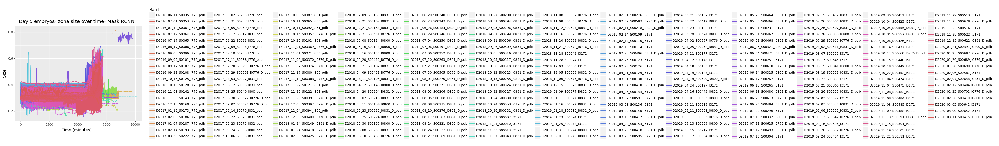

<ggplot: (8739415070693)>

In [20]:
plot = (p9.ggplot(data = day_5_mask_data,
mapping = p9.aes(x = 'Time', y = 'Zona', color = 'Batch')))
plot + p9.geom_line() + p9.labs(title = "Day 5 embryos- zona size over time- Mask RCNN", x='Time (minutes)', y='Size')

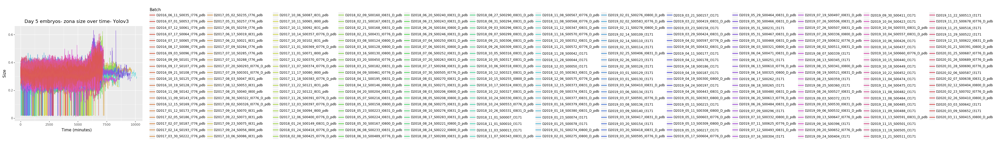

<ggplot: (8739430604269)>

In [22]:
plot = (p9.ggplot(data = day_5_yolo_data,
mapping = p9.aes(x = 'Time', y = 'Zona', color = 'Batch')))
plot + p9.geom_line() + p9.labs(title = "Day 5 embryos- zona size over time- Yolov3", x='Time (minutes)', y='Size')

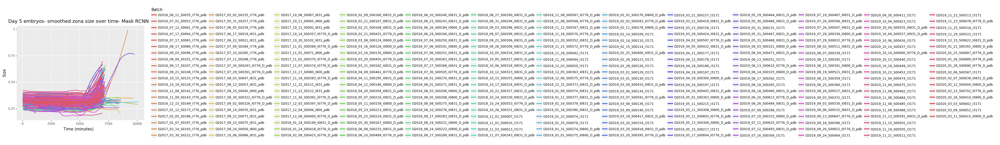

<ggplot: (8739414668293)>

In [23]:
plot = (p9.ggplot(data = day_5_mask_data,
mapping = p9.aes(x = 'Time', y = 'Zona', color = 'Batch')))
plot + p9.geom_smooth(method = 'loess', span = 0.4, se=False) + p9.labs(title = "Day 5 embryos- smoothed zona size over time- Mask RCNN", x='Time (minutes)', y='Size')

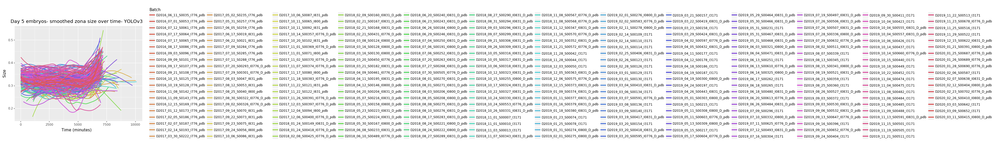

<ggplot: (8739426399929)>

In [24]:
plot = (p9.ggplot(data = day_5_yolo_data,
mapping = p9.aes(x = 'Time', y = 'Zona', color = 'Batch')))
plot + p9.geom_smooth(method = 'loess', span = 0.4, se=False) + p9.labs(title = "Day 5 embryos- smoothed zona size over time- YOLOv3", x='Time (minutes)', y='Size')

In [9]:
day_5_batches = []
with open('/data/embryo/csv/final_max_mask.csv', 'r') as read_obj:
    csv_dict_reader = DictReader(read_obj)
    for row in csv_dict_reader:
        batch = row['Batch']
        id = row['ID']
        dir_name = batch + '_pdb_' + id
        dir_path = Path(base_dir + dir_name)
        if dir_path.exists():
            dir_name = dir_name
        else:
            batch = batch.rsplit('_P', 1)[0]
            dir_name = batch + '_' + id
            dir_path = Path(base_dir + dir_name)
        if dir_name in day_5 and batch not in day_5_batches:
            day_5_batches.append(batch)


In [14]:
for batch in day_5_batches:
    batch_data = mask_data.loc[mask_data['Batch'] == batch]
    plot = (p9.ggplot(data = batch_data, mapping = p9.aes(x = 'Time', y = 'Zona', color = 'ID')))
    plot = plot + p9.geom_smooth(method = 'loess', span = 0.2, se=False) + p9.labs(title = "Batch {}: Day 5 embryos- smoothed zona size over time- Mask RCNN".format(batch), x='Time (minutes)', y='Size') + p9.xlim(0,8000) + p9.ylim(0,0.6)
    plot.save(filename='/home/embryosu/git/su/embryo/day_5_plots_mask/{}.png'.format(batch))


In [52]:
plot = (p9.ggplot(data = day_6_mask_data,
mapping = p9.aes(x = 'Time', y = 'Zona', color = 'Dir')))
plot = plot + p9.geom_line() + p9.labs(title = "Day 6 embryos- zona size over time- Mask RCNN", x='Time (minutes)', y='Size')
plot.save(filename='/home/embryosu/git/su/embryo/example_plot.png')

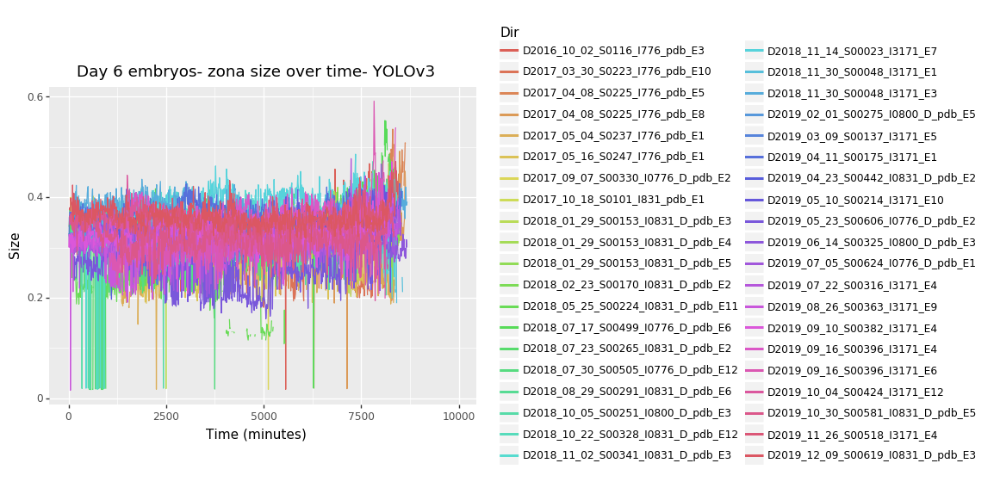

<ggplot: (8739430576573)>

In [9]:
plot = (p9.ggplot(data = day_6_yolo_data,
mapping = p9.aes(x = 'Time', y = 'Zona', color = 'Dir')))
plot + p9.geom_line() + p9.labs(title = "Day 6 embryos- zona size over time- YOLOv3", x='Time (minutes)', y='Size')

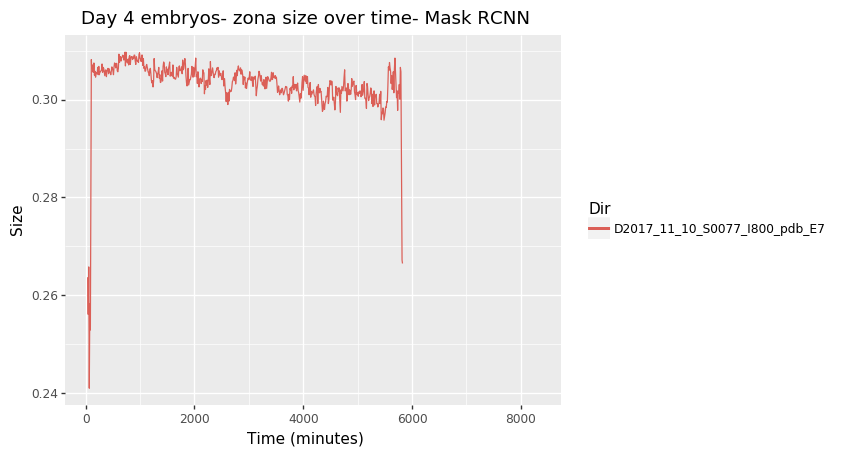

<ggplot: (8739430601037)>

In [10]:
plot = (p9.ggplot(data = day_4_mask_data,
mapping = p9.aes(x = 'Time', y = 'Zona', color = 'Dir')))
plot + p9.geom_line() + p9.labs(title = "Day 4 embryos- zona size over time- Mask RCNN", x='Time (minutes)', y='Size')

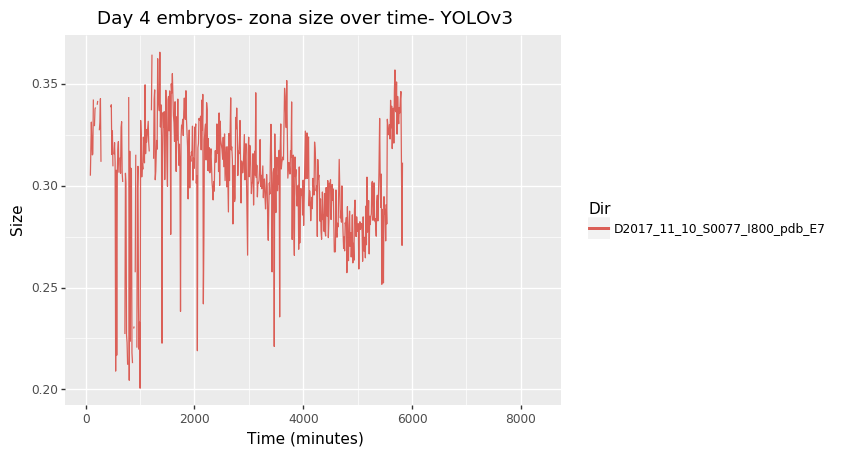

<ggplot: (8739430598893)>

In [17]:
plot = (p9.ggplot(data = day_4_yolo_data,
mapping = p9.aes(x = 'Time', y = 'Zona', color = 'Dir')))
plot + p9.geom_line() + p9.labs(title = "Day 4 embryos- zona size over time- YOLOv3", x='Time (minutes)', y='Size')

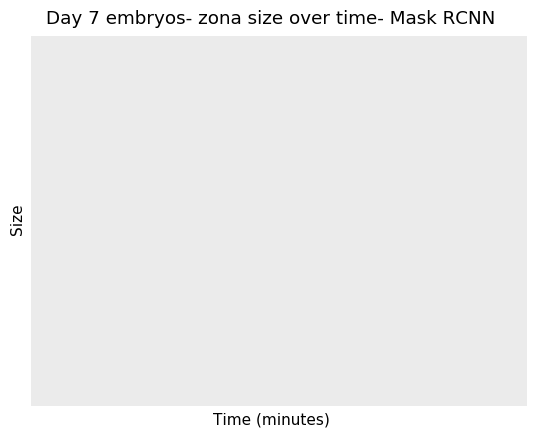

<ggplot: (8739430596293)>

In [12]:
plot = (p9.ggplot(data = day_7_mask_data,
mapping = p9.aes(x = 'Time', y = 'Zona', color = 'Dir')))
plot + p9.geom_line() + p9.labs(title = "Day 7 embryos- zona size over time- Mask RCNN", x='Time (minutes)', y='Size')

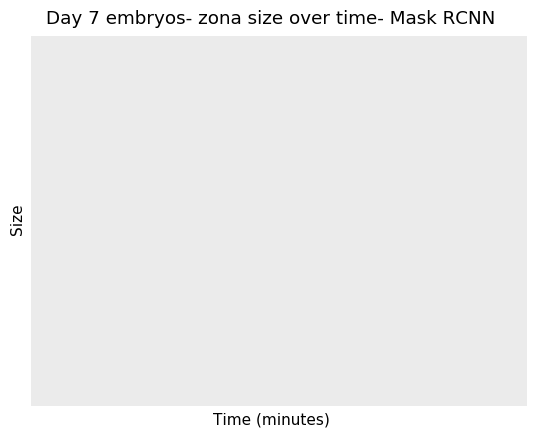

<ggplot: (8739430597357)>

In [13]:
plot = (p9.ggplot(data = day_7_mask_data,
mapping = p9.aes(x = 'Time', y = 'Zona', color = 'Dir')))
plot + p9.geom_line() + p9.labs(title = "Day 7 embryos- zona size over time- Mask RCNN", x='Time (minutes)', y='Size')

In [14]:
day_7

['D2018_05_03_S00474_I0776_D_pdb_E5']

In [2]:
day_6_data = pd.read_csv("/data/embryo/csv/day_6.csv")

In [12]:
day_6_batches = [
    'D2017_03_30_S0223_I776_pdb',
    'D2017_09_07_S00330_I0776_D_pdb',
    'D2017_10_18_S0101_I831_pdb',
    'D2018_01_29_S00153_I0831_D_pdb',
    'D2019_02_01_S00275_I0800_D_pdb',
    'D2019_04_23_S00442_I0831_D_pdb'
]

In [14]:
for batch in day_6_batches:
    batch_data = day_6_data.loc[day_6_data['Batch'] == batch]
    plot = (p9.ggplot(data = batch_data, mapping = p9.aes(x = 'Time', y = 'Zona', color = 'ID')))
    plot = plot +  p9.geom_line() + p9.labs(title = "Batch {}: Day 6 embryos- unsmoothed zona size over time- Mask RCNN".format(batch), x='Time (minutes)', y='Size') + p9.xlim(0,8500) + p9.ylim(0,0.6)
    plot.save(filename='/home/embryosu/git/su/embryo/day_6_plots_mask/{}.png'.format(batch))